Group project

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms

import matplotlib.pyplot as plt
from tqdm import tqdm
import numpy as np

import cv2
from torchcam.methods import SmoothGradCAMpp

##### dataset : https://www.kaggle.com/datasets/puneet6060/intel-image-classification

In [40]:
val_test_transform = transforms.Compose(
    [transforms.Resize((224,224)),
     transforms.ToTensor(),
     transforms.Normalize(mean=[0.5,0.5,0.5], std=[0.5,0.5,0.5])])
dataset = torchvision.datasets.ImageFolder(root='./dataset/seg_test/seg_test', transform=val_test_transform)

train_dataset = torchvision.datasets.ImageFolder(root='./dataset/seg_train/seg_train', transform=val_test_transform)
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=32, shuffle=True)

# select random 150 images from test dataset
random_indices = torch.randperm(len(dataset))[:50]
test_dataset = torch.utils.data.Subset(dataset, random_indices)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=1, shuffle=False)

In [41]:
classes = ('buildings', 'forest', 'glacier', 'mountain', 'sea', 'street')
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


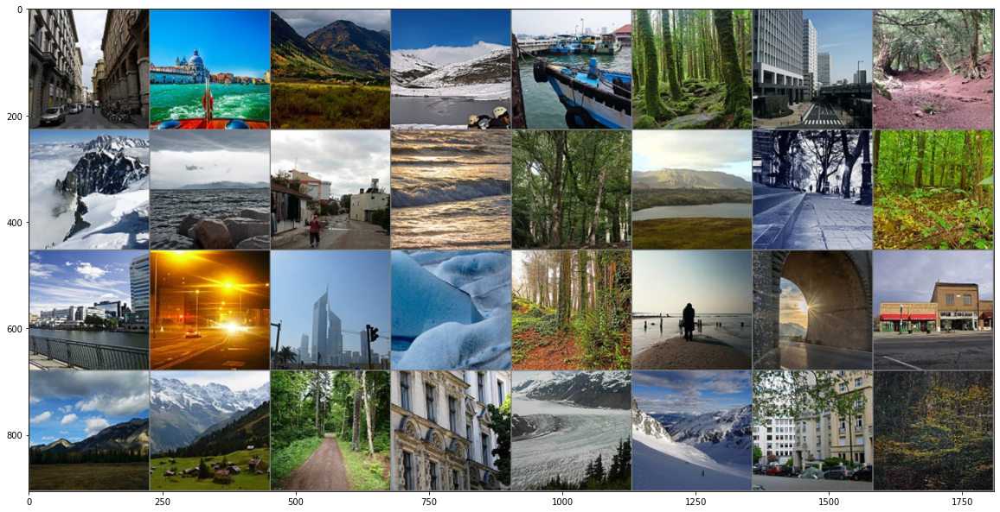

In [42]:
def imshow(img, title=None):
    img = img / 2 + 0.5
    npimg = img.numpy()
    plt.figure(figsize=(20,20))
    plt.imshow(np.transpose(npimg, (1,2,0)))
    plt.show()

# plot images from test dataset
dataiter = iter(train_loader)
images, labels = next(dataiter)
imshow(torchvision.utils.make_grid(images), title=[classes[x] for x in labels], )


# Approaches

## 1. Grad Cam

### 1.1 Summarization

Grad-CAM, which stands for Gradient-weighted Class Activation Mapping, is a technique for making convolutional neural networks (CNNs) more transparent by visualizing the regions of input that are important for predictions from these models. It uses the gradients of any target concept (say logits for ‘dog’ or even a caption), flowing into the final convolutional layer to produce a coarse localization map highlighting the important regions in the image for predicting the concept.

WHY GRAD-CAM?

We wanted to train a model to classify images in the Intel Image Classification dataset. To do this, we used the pre-trained model ResNet18, which was trained on the massive ImageNet dataset. We then fine-tuned this pre-trained model by training it on our own data. This process is known as transfer learning.

When performing transfer learning, it is important to ensure that the pre-trained model is focusing on the correct features in the new dataset. The features that are relevant in one dataset may not be the same as the features that are relevant in another dataset. Grad-CAM is a technique that can be used to identify the specific areas of an image that are most important to the model's classification decision. This can help to ensure that the model is not relying on irrelevant features and that it is capturing the most important aspects of the data.

Grad-CAM can also be used to identify if there is a need for additional training data. If the model is not highlighting the relevant areas of the image, this may indicate that the dataset is not large enough or diverse enough to capture the full range of features that are present in the target classes. In this case, more data would need to be collected or generated to improve the performance of the model.

In summary, transfer learning is a powerful technique that can be used to train models on new datasets with limited data. Grad-CAM is a tool that can be used to assess the quality of the transferred model and identify areas where additional training may be necessary. By using these techniques together, we can develop models that can effectively classify images in the Intel Image Classification dataset.

In [43]:
class Net(nn.Module):
    def __init__(self):
        super().__init__()
        self.pre_trained = torchvision.models.resnet18(pretrained=True)
        self.pre_trained.fc = nn.Linear(512, 6)
    
    def forward(self, x):
        x = self.pre_trained(x)
        return x

model = Net()
model.load_state_dict(torch.load('best_resnet18.pth'))
model.eval()

# hook the feature extractor

def hook(module, input, output):
    module.output = output

model.pre_trained.layer4.register_forward_hook(hook)
cam_extractor = SmoothGradCAMpp(model, target_layer=model.pre_trained.layer4)

/home/developer/.local/lib/python3.8/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/developer/.local/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [47]:
class_names = ["buildings", "forest", "glacier", "mountain", "sea", "street"]
correct_data = []
incorrect_data = []

for i, (data, label) in enumerate(test_dataset):
    out = model(data.unsqueeze(0))
    cams = cam_extractor(out.squeeze(0).argmax().item(), out)
    pred = class_names[out.squeeze(0).argmax().item()]
    actual = class_names[label]

    for j, cam in enumerate(cams):
        cam = cam.squeeze(0).numpy()
        cam = cv2.resize(cam, (224, 224))
        cam = np.maximum(cam, 0)
        heatmap = cam / np.max(cam)
        cam = cv2.applyColorMap(np.uint8(255 * heatmap), cv2.COLORMAP_JET)
        img = data.squeeze(0)
        print
        img = data.numpy().transpose((1,2,0))
        img = img * np.array([0.5, 0.5, 0.5]) + np.array([0.5, 0.5, 0.5])
        if pred == actual:
            correct_data.append((img, cam, pred, actual))
        else:
            incorrect_data.append((img, cam, pred, actual))

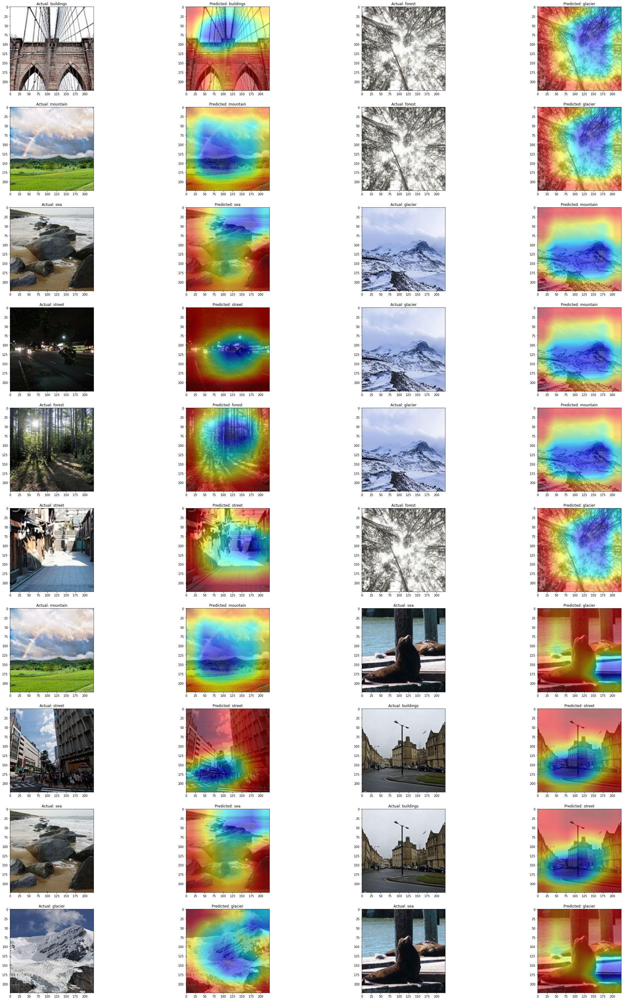

In [48]:
# plot random 10 correct and 10 incorrect images with gradcam and label
import matplotlib.pyplot as plt
import random

fig, axs = plt.subplots(10, 4, figsize=(40, 60))
for i in range(10):
    correct_img, correct_cam, correct_pred, correct_actual = random.choice(correct_data)
    incorrect_img, incorrect_cam, incorrect_pred, incorrect_actual = random.choice(incorrect_data)
    axs[i, 0].imshow(correct_img)
    axs[i, 0].set_title(f'Actual: {correct_actual}')

    axs[i, 1].imshow(correct_img)
    axs[i, 1].imshow(correct_cam, alpha=0.5)
    axs[i, 1].set_title(f'Predicted: {correct_pred}')

    axs[i, 2].imshow(incorrect_img)
    axs[i, 2].set_title(f'Actual: {incorrect_actual}')

    axs[i, 3].imshow(incorrect_img)
    axs[i, 3].imshow(incorrect_cam, alpha=0.5)
    axs[i, 3].set_title(f'Predicted: {incorrect_pred}')

### 1.3 Interpretation of results

The initial assumptions was that the Intel image classification dataset, which is straightforward and comprises six distinct image categories with little overlap, would be suitably addressed by an advanced model like ResNet18.

However, the actual results deviated from expectations. The model achieved an accuracy rate of about 85%, which is relatively low for a model designed with 18 million parameters. Employing Grad-CAM, a technique for visualizing which parts of an image a model focuses on, it was observed that the model frequently concentrated on the backgrounds rather than the main subjects of the images. This misalignment is likely why the model did not classify images correctly.

For instance, a glacier image was mistakenly identified as a mountain because the model's attention was on the surrounding scenery, not the glacier. Yet, when the glacier occupied most of the image, the model recognized it correctly, indicating that the model can identify the main subject when background distractions are minimal.

This leads to several possible conclusions:

The dataset might be too small for the model to learn effectively.
The model may lack the necessary sophistication to extract and learn intricate features of the images.
The focus of the model might not be adequately fine-tuned to discern the primary features of the images.
There may be an insufficient number of images for each category, hindering the model's ability to learn distinct features.
These insights suggest that improvements in the dataset size, model complexity, or the model's focusing ability could be beneficial for better performance.

## 2. Adversarial Examples

### 2.1 Summarization

As the lecture states the adversarial examples target to deceive models. As our model works with image data, it is very interesting to see how robust our model is and which positions of the image with modified content lead to a different model prediction. 

For this assignment we focused on a paper of Zuo et al. (2023) which introduces the Multiple Initial Solution Particle Swarm Optimization Attack (MISPSO-Attack). The authors follow the idea that a simple positioning of a watermark within the image can modify the model output. It uses a visible, transparent watermark that only covers 1/16 of the image size, else the task would be too easy. The algorithm strategically positions the watermark within the image. To anticipate one thing, different positions of the same watermark lead to different model outcomes (failure and success of the attack). <br>
For this process, firstly key-points of the image are extracted. Thorugh iteration the ideal position is then determined. However, even the paper reaches in case of ResNet101 a success rate of only 68.50 % when it uses logos of different institutions. When those logos and special adversarial patches are used together for the same network a score of 83.60 % is reached [2]. 

It becomes clear that we have a similar model, namely ResNet18, with much fewer classes. It is interesting to see how the MISPSO-Attack performs on our model. We have to mark that the algorithm is rather slow and we can only use cpu power. Therefore, we ran the algorithm over several days and focus on the essential aspects. To concretely implement the algorithm we used the already provided repository https://github.com/grandwang/main_attack [2]. We modified the files slightly by amending the computation to cpu, importing our model with its learned weights, fitting the algorithm to our image sizes of 224x224 and storing also failed trials. The folder of relevance is 'main_attack-main'. The python file to start the process is called 'start_process.py'.

We worked with the MIT logo which was also used by the original paper [2]:
<img src="main_attack-main/logo/MIT.png" width="240" height="240" align="center"/>


### 2.2 Hohman et al. criteria

WHY: Two use cases of adversarial examples are data protection and copy right compliance [2]. When a network is fooled it can't detect for example private houses or faces of people. Also protected images can't be used easily without compliance of copy right. Beyond that also explainability plays a role. With adversarial attacks we end up with an image which is easily recognizable by amateurs, even when a watermark is positioned on them. Thus, those amateurs can better understand the weak points of AI. It becomes clear to everyone that a network might not be as reliable as it seems to be at the first glance.
    
WHAT: It can be visualized which positions containing certain image information are vulnerable to adversarial attacks and therefore curcial for prediction. The feature is in this case the affected pixel area containing certain colors and patterns. Slightly changing the position can lead to a failure of the adversarial attack. This shows us that the learned kernels might focus on specific patterns which only appear in rare positions of the image. 
    
WHEN: After training. It is only for discovering the learned model behaviour.

WHO: First of all image creators would benefit as their chargeable content can't be easily stolen anymore. Also private persons who share their private images in the internet but don't want that their images are exploited in a large scale could make use of it. Amateurs can learn about the borders of AI as explained above. 

HOW: The visualization is relatively easy in this case. For instance, we can visualize the original image, the used watermark, the original image with positioned watermark on it of successful attack, and also the latter but for a failing attack. Thorugh that the effect of an adversarial attack can be outlined.

WHERE: As stated above for copy-right compliance [2]. Also in training of Generative Adversarial Networks (GANs) adversarial attacks can be used to overcome such attacks. 

### 2.3 Interpretation of results

In [2]:
'''

To run the adversarial attack method you have to activate the belonging environment.yml which is placed in
the "folder main_attack-main". The name of this environment is "adversarial". 
Next, you can start the process of generating images by running the following code. Be aware of the target
path and your current terminal location:

! python main_attack-main/attack/start_process.py

''';

**Example of...**

**... failure (network still predicts the correct class):** 
![failed.jpg](main_attack-main/attack/Results1/images/3/3/failed.jpg)
**...success (network starts predicting the false class):**
![AfterPSO.jpg](main_attack-main/attack/Results1/images/3/AfterPSO.jpg)
Here can be seen that running the MISPSO-Attack two times for the same picture produces different outcomes, in this case one successful and one failing for the glacier class image. Notice that the logo has slightly different positions on the two images which appear irrelevant for the human evaluator. Even further, the successful image's watermark is less transparent what has an stronger impact on network prediction.

**True class glacier:**<br>
<br>
Tried samples: 50 <br>
Attack success rate: 20 %<br>
<br>
**Examples of failing attacks**
![failed.jpg](main_attack-main/attack/Results2_glacier/images/6/failed.jpg)
![failed.jpg](main_attack-main/attack/Results2_glacier/images/51/failed.jpg)
![failed.jpg](main_attack-main/attack/Results2_glacier/images/9/failed.jpg)
![failed.jpg](main_attack-main/attack/Results2_glacier/images/60/failed.jpg)

**Examples of successful attacks**
![success.jpg](main_attack-main/attack/Results2_glacier/images/success_examples/AfterPSO_PredSea_Sample21210_.jpg)
True class: glacier <br>
Predicted class: sea <br>
Softmax distribution: [2.55737626e-05 8.66387700e-06 <font style="color:DodgerBlue;">2.78050960e-01</font> 2.75076567e-04
  <font style="color:Tomato;">7.18998170e-01</font>
 2.64155617e-03]<br>
with [buildings, forest, <font style="color:DodgerBlue;">glacier</font>
, mountain, <font style="color:Tomato;">sea</font>
, street]

![success.jpg](main_attack-main/attack/Results2_glacier/images/success_examples/AfterPSO_PredSea_Sample21949_.jpg)
True class: glacier <br>
Predicted class: sea <br>
Softmax distribution: [1.46451571e-04 1.19112772e-06 <font style="color:DodgerBlue;">2.83965341e-01</font> 1.08340486e-03
  <font style="color:Tomato;">7.06320884e-01</font>
 8.48272654e-03]<br>
with [buildings, forest, <font style="color:DodgerBlue;">glacier</font>
, mountain, <font style="color:Tomato;">sea</font>
, street]

![success.jpg](main_attack-main/attack/Results2_glacier/images/success_examples/AfterPSO_PredSea_Sample21544_.jpg)
True class: glacier <br>
Predicted class: sea <br>
Softmax distribution: [2.97745106e-04 9.18317180e-05 <font style="color:DodgerBlue;">3.49773459e-01</font> 1.95349011e-02
  <font style="color:Tomato;">6.29698291e-01</font>
 6.03772803e-04]<br>
with [buildings, forest, <font style="color:DodgerBlue;">glacier</font>
, mountain, <font style="color:Tomato;">sea</font>
, street]

![success.jpg](main_attack-main/attack/Results2_glacier/images/success_examples/AfterPSO_PredForest_Sample22857_.jpg)
True class: glacier <br>
Predicted class: forest <br>
Softmax distribution: [2.65358216e-03 <font style="color:Tomato;">6.51005875e-01</font>
 <font style="color:DodgerBlue;">3.43000294e-01</font> 7.02256251e-04
  2.13930486e-03 4.98687355e-04]<br>
with [buildings, <font style="color:Tomato;">forest</font>
, <font style="color:DodgerBlue;">glacier</font>
, mountain, sea, street]


It is a eye-catcher that on the images on that adversarial attack failed sea is clearly visible. Still the network is not irritated and predicts 'glacier'. The irony behind it is that in the first two images of successful adversarial attack no sea is visible at all but the final prediction is 'sea'. Looking at the first one, color setting and wave-like structured stones could fit to the sea dataset. The watermark seems to encourge this attributes through its strategic positioning. It follows, that the network is quite sure about its 'sea' predciction, ca. 71 %. <br>
Also the second successful image gets promoted by the watermark in its sea-like sturcture, as the glacier appears to be a river. Here is even a very transparent watermark enough to irritate the network.<br>
The last example of successful examples is predicted as 'forest'. At least, the structure of ice could be interpreted as a similar structure of treetop cluster. The watermark seems to enforce this observation. However, the last failed example has a similar structure and is still predicted correctly.

**True class street:**<br>
<br>
Tried samples: 5 <br>
Attack success rate: 80 %<br>
<br>
**Examples of failing attacks**
![failed.jpg](main_attack-main/attack/Results3_street/images/2582/failed.jpg)

**Examples of successful attacks**

![success.jpg](main_attack-main/attack/Results3_street/images/success_examples/AfterPSO_PredGlacier_Sample20183_.jpg)
True class: street <br>
Predicted class: glacier <br>
Softmax distribution: [1.56671464e-03 2.32432038e-03 <font style="color:Tomato;">9.51043753e-01</font>
 6.15747906e-05
  1.01993237e-03 <font style="color:DodgerBlue;">4.39837052e-02</font>]<br>
with [buildings, forest, <font style="color:Tomato;">glacier</font>
, mountain, sea, <font style="color:DodgerBlue;">street</font>
]

![success.jpg](main_attack-main/attack/Results3_street/images/success_examples/AfterPSO_PredSea_Sample22898_.jpg)
True class: street <br>
Predicted class: sea <br>
Softmax distribution: [2.82306290e-05 2.10644446e-07 2.18007983e-03 6.38892707e-03
 <font style="color:Tomato;">9.23798132e-01</font>
  <font style="color:DodgerBlue;">6.76044199e-02</font>]<br>
with [buildings, forest, glacier, mountain, <font style="color:Tomato;">sea</font>
, <font style="color:DodgerBlue;">street</font>
]

![success.jpg](main_attack-main/attack/Results3_street/images/success_examples/AfterPSO_PredBuildings_Sample23810_.jpg)
True class: street <br>
Predicted class: buildings <br>
Softmax distribution: [<font style="color:Tomato;">5.78116928e-01 </font>
 1.28665820e-05 7.26621946e-05 2.89610771e-05
  2.48586694e-05 <font style="color:DodgerBlue;">4.21743723e-01</font>]<br>
with [<font style="color:Tomato;">buildings</font>
, forest, glacier, mountain, sea, <font style="color:DodgerBlue;">street</font>
]


The meaning of positioning and transparency of watermark can be visualized by the failed example and the first successful example. Both pictures have a similar content but only one of them is predicted falsely as 'glacier' with a network certainty of ca. 95 %. <br>
The second successful example shows the power of adversarial attacks. The network assumes with ca. 92 % certainty to see a sea. <br>
In the last successful example the watermark seems to shift the focus from the class 'street' to 'buildings' without even covering the whole street. It only disrupts the street line at the foreground. However, the watermark had not such a strong impact here as the buildings are also visible in this image and the certainty of buildings reaches ca. 58 %, whereas 'street' isn't with ca. 42 % that far away.

**True class buildings:**<br>
<br>
Tried samples: 6 <br>
Attack success rate: 33 %<br>
<br>
**Examples of failing attacks**
![failed.jpg](main_attack-main/attack/Results4_buildings/images/1707/failed.jpg)
![failed.jpg](main_attack-main/attack/Results4_buildings/images/1708/failed.jpg)
![failed.jpg](main_attack-main/attack/Results4_buildings/images/1714/failed.jpg)
![failed.jpg](main_attack-main/attack/Results4_buildings/images/1706/failed.jpg)

**Examples of successful attacks**

![success.jpg](main_attack-main/attack/Results4_buildings/images/success_examples/AfterPSO_PredStreet_Sample21104_.jpg)
True class: buildings <br>
Predicted class: street <br>
Softmax distribution: [<font style="color:DodgerBlue;">2.18816796e-02</font> 1.06965235e-11 9.86303666e-09 2.37087576e-08
  2.24622162e-07 <font style="color:Tomato;">9.78118062e-01 </font>
]<br>
with [<font style="color:DodgerBlue;">buildings</font>, forest, glacier, mountain, sea, <font style="color:Tomato;">street</font>]

![success.jpg](main_attack-main/attack/Results4_buildings/images/success_examples/AfterPSO_PredGlacier_Sample21296_.jpg)
True class: buildings <br>
Predicted class: glacier <br>
Softmax distribution: [<font style="color:DodgerBlue;">3.80266435e-02</font> 1.24495099e-07 <font style="color:Tomato;">9.34764579e-01 </font> 1.69482078e-04
  8.66635776e-07 2.70383047e-02]<br>
with [<font style="color:DodgerBlue;">buildings</font>, forest, <font style="color:Tomato;">glacier</font>, mountain, sea, street]


It is striking that for the failing adversarial attacks, images don't show any ground or street. All the buildings show clear rectangular window structures. For the case of images which are successfully attacked ground is visible. In case of the first instance the final predicted class is 'street' and for the latter one 'glacier' with softmax probabilities higher than 90 %. So, the network is clearly fooled as it is convinced to observe a street (which is actually also there) and a glacier. The watermark was able to manipulate the outputs. In the first image the watermark isn't even near the building. This suggests that the information about the building isn't simply distorted by watermark overlay, but the watermark influences parameters which doesn't seem to be connected to the image content but have strong impact on the final output. 

In summary, comparison of images of failed and successful adversarial attacks shows especially to amateurs that a hidden network structure with learned parameters might be influenced by irrelevant information, like watermarks. So, he or she understands that outcomes of neural networks can be manipulated and obvious features like, shapes of illustrated objects, might not play a crucial role in network prediction. Instead the amateur learns that neural networks operate on a non-human-like behavioral level with non-plausible feature focus.

## 3. Prototype and criticism

### 3.1 Summarization

Prototypes and Criticisms is a technique to explore which samples are detected well and which not. As our model works with image data, it is very interesting to see how robust our model is and which samples are hard to predict. 

For this assignment we focused on an own approach to identify prototypes and criticisms. We follow the idea that an image is reliably classified (aka a prototype) if the softmax distribution of the prediction shows a clear decision for the assignment to a class and compared to the ground-truth the assignment was correct. On the other hand, criticisms have undecisive softmax distributions or yield wrong classification results. Our algorithm therefore compares the softmax probabilities for each sample. Firstly, the probability of the ground-truth class gets seperated and removed from the others. Second the remaining maximum probability value of this sample gets substracted from the ground-truth probability. The resulting float value is our score. The higher the float score, the better / more-confident was the classification. In case the score gets close to zero, the classifier was not sure what class should be assigned to the sample. The sign gives information about if the sample was classified correctly or not. For example a score of 0.2 would mean that a classifier predicted the correct label and was pretty confident doing so. On the other hand -0.05 means that the classifier was pretty unsure (magnitude 0.05) about the class assignment and assigned the wrong label (negative sign).

### 3.2 Hohman et al. criteria

WHY: There exists multiple use-cases for the explainability technique 'Prototype and criticism'. Regarding interpretability it helps to better understand the models class representitives (prototypes) [1]. On the other side manual or automated error analysis from 'criticism' can be used to improve the model by feature engineering or the data doing quality assessment. In general it allows targeted improvements which also supports users trust, can identify biases and help to further increase robustness.
    
WHAT: It can be visualised what samples of a certain distribution are considered as representatives of a certain class by the model (prototypes). Additionally, samples which are close to or already misclassified can be identified (criticism).
    
WHEN: After a training. Evaluating the model on a specific distribution of samples.

WHO: Model developers & builders profit from the insights to further increase robustness and identify failure cases. Model users can better understand the models limitations and therefore gain user trust.

HOW: This approach works best using a distinct distribution of samples, like an additional test set which should also be used just once. Meaning that if you refine training because of the output of this technique, the performance can only be tested using a set of samples from a different distribution again. 

Our approach starts with the softmax probabilities of a single-sample prediction from a distinct test-set:

<img src="prototypes_criticisms_img/pc1.png" width="500" height="300" align="center" style="background-color:white;"/>

Step 1: the softmax probability of the ground-truth label gets excluded:

<img src="prototypes_criticisms_img/pc2.png" width="500" height="300" align="center" style="background-color:white;"/>

Step 2: the remaining highest softmax probability gets identified:

<img src="prototypes_criticisms_img/pc3.png" width="500" height="300" align="center" style="background-color:white;"/>

Step 3: the second value gets substracted from the first; the resulting float value is our custom score (yellow):

<img src="prototypes_criticisms_img/pc4.png" width="500" height="300" align="center" style="background-color:white;"/>

In case the sample got misclassified, the score automatically gets negative:

<img src="prototypes_criticisms_img/pc5.png" width="500" height="300" align="center" style="background-color:white;"/>

When the score is positive and over some application-specific threshold, the prediction was correct and confident. For positive score values the predicted class is correct but less confident as it approaches zero. For zero itself and negative scores it is defined as a misclassification with misleadingly increasing confidence when moving away from zero to the negatives.

WHERE: As stated above usable for all classification models to increase robustness during development and enhance user trust.

In [61]:
model_resnet18 = Net()
model_resnet18.load_state_dict(torch.load('best_resnet18.pth'))
model_resnet18.eval()

examples_per_class = {}

# select random 150 images from test dataset
random_indices = torch.randperm(len(dataset))[:150]
test_dataset = torch.utils.data.Subset(dataset, random_indices)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=1, shuffle=False)

# iterate over test-data
for images, labels in test_loader:

    # not use grads
    with torch.no_grad():

        # get outputs of model for provided images
        outputs = model_resnet18(images)

        # compute softmax for later comparing of probs
        probs = torch.nn.functional.softmax(outputs, dim=1)

        # get predictions
        predictions = torch.argmax(outputs, dim=1)

    # iterate over predictions
    for i in range(len(predictions)):

        # convert probabilities of one sample to list
        probs_i = probs[i].tolist()

        # retrieve label
        true_label = int(labels[i])

        # extract prob of true label
        prob_true_label = probs_i[true_label]

        # remove prob of true label from array
        probs_i.remove(prob_true_label)

        # calculate difference of true label prob and (second) max prob as score for sureness
        spread = float(prob_true_label - max(probs_i))
        
        # define new sub-dict if not present
        if true_label not in examples_per_class:
            examples_per_class[true_label] = {}
        
        # store image with spread-value as key
        examples_per_class[true_label][spread] = {'image': images[i].clone().detach().cpu(), 
                                                  'pred_label': predictions[i]}

/home/developer/.local/lib/python3.8/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/developer/.local/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


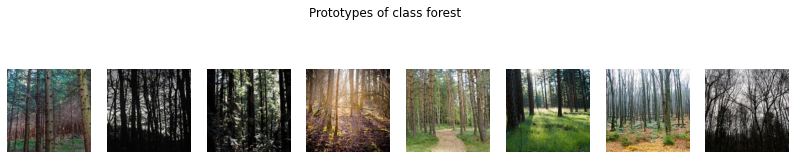

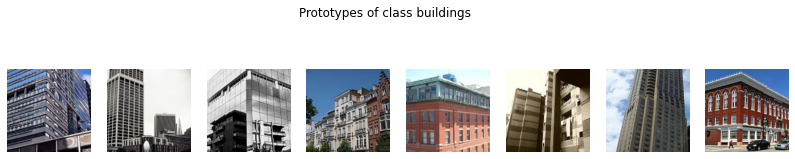

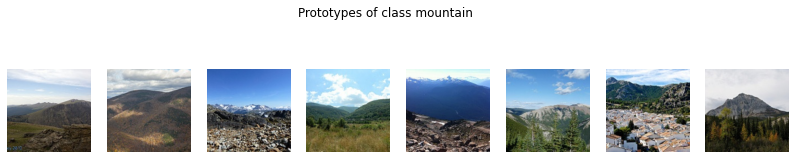

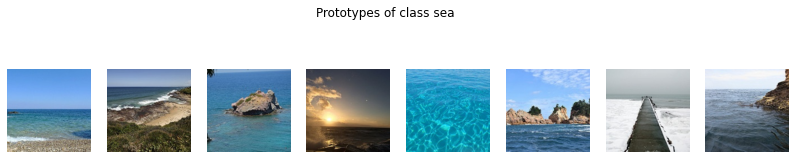

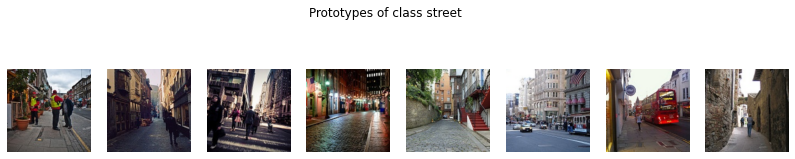

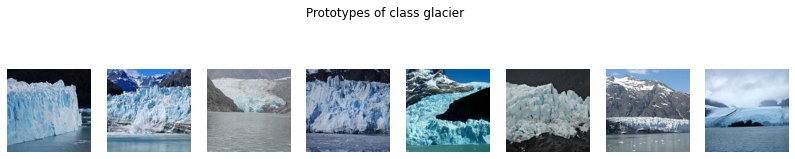

In [62]:
def denormalize(img):
    img = img / 2 + 0.5
    return img

# iterate over processed test-set
for class_i, images_dict in examples_per_class.items():

    # sort correctly classified examples by confidence score
    sorted_dict = dict(sorted(images_dict.items(),reverse=True))

    # extract images
    images = [obj['image'] for obj in sorted_dict.values()]
    images = [denormalize(img) for img in images]

    # extract prediction labels
    # preds = [obj['pred_label'] for obj in sorted_dict.values()]

    # check if correctly classified samples exist
    if len(sorted_dict) > 0:

        # add subplots
        fig, axs = plt.subplots(1,8,figsize = (14,3))

        # define title
        fig.suptitle(f"Prototypes of class {classes[class_i]}")

        # fill subplots one by one
        for i, ax in enumerate(axs):

            # plot images
            ax.imshow(images[i].permute(1,2,0))

            # print predicted class as title
            # ax.set_title(f'pred: {classes[preds[i]]}')
            
            # turn off axis
            ax.set_axis_off()

        # display plot
        plt.show()

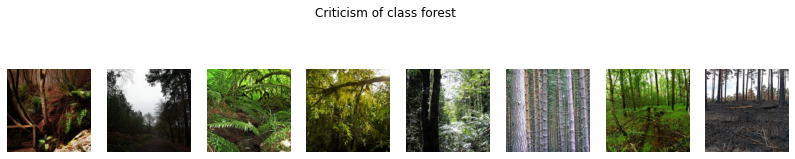

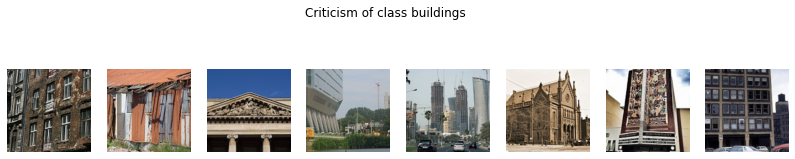

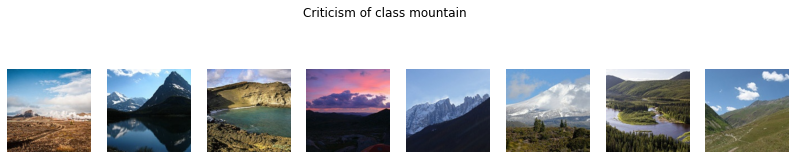

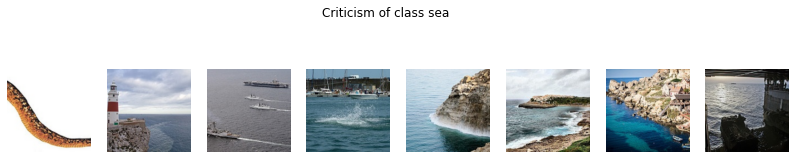

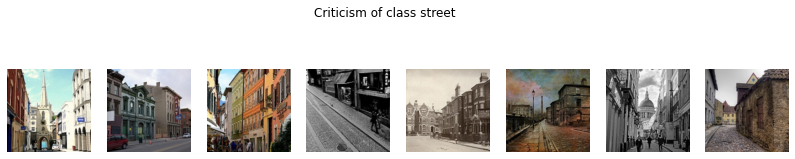

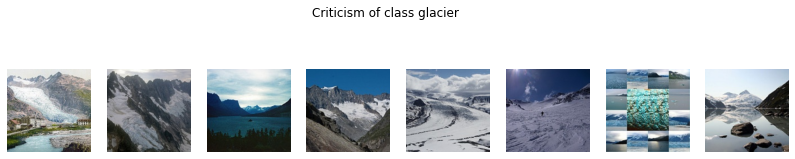

In [64]:
# iterate over processed test-set
for class_i, images_dict in examples_per_class.items():

    # sort correctly classified examples by confidence score
    sorted_dict = {key:value for key, value in dict(sorted(images_dict.items(),reverse=False)).items() if key >= 0}

    # extract images
    images = [obj['image'] for obj in sorted_dict.values()]
    images = [denormalize(img) for img in images]
    # extract prediction labels
    # preds = [obj['pred_label'] for obj in sorted_dict.values()]

    # check if correctly classified samples exist
    if len(sorted_dict) > 0:

        # add subplots
        fig, axs = plt.subplots(1,min(8,len(sorted_dict)),figsize = (14,3))

        # define title
        fig.suptitle(f"Criticism of class {classes[class_i]}")

        # fill subplots one by one
        for i, ax in enumerate(axs):

            # plot images
            ax.imshow(images[i].permute(1,2,0))

            # print predicted class as title
            # ax.set_title(f'pred: {classes[preds[i]]}')

            # turn off axis
            ax.set_axis_off()
        
        # display plot
        plt.show()

### 3.3 Interpretation of results

The images evaluated are taken from the test set of the linked dataset as the Prototypes and Criticism technique should be applied on a distinct distribution to gain meaningful output. In general the output shows for the prototypes what images are clearly in learned class-distribution of the model and for the criticisms it shows which were hard to predict.

#### Class Forest

For the class forest it can be said that the images presented as prototypes are way easier to identify as such - even for us as humans. With the help of those images it is easy to identify sorts of images the model has not yet learned on well. The prototypes section contains images as one would see in advertisements, professional images or even movies. While the criticisms contain images one would not make public, as most people would not consider they look 'good enough'. Therefore, the bias of having 'pretty' images of forests overpopulated in the training set can be identified using this technique. In case I would like to apply this model for some application I would already be informed about this limitation when using this technique.

<img src="prototypes_criticisms_img/prototypes_forest.png" width="1000" height="200" align="center" style="background-color:white;"/>
<img src="prototypes_criticisms_img/criticisms_forest.png" width="1000" height="200" align="center" style="background-color:white;"/>

#### Class Buildings

For the class buildings it can be said that the images presented as prototypes are way newer builds and photographed differently with regard to what is shown on the image itself. With the help of those images it is easy to identify sorts of images the model has not yet learned on well. The prototypes section contains images as one would see buildings nowadays in developed countries. While the criticisms contain close-up images of demolished buildings, older ones or with a lot of other stuff shown on the picture. Therefore, the bias of having newer buildings overpopulated in the training set can be identified using this technique. In case I would like to apply this model for some application I would already be informed about this limitation when using this technique.

<img src="prototypes_criticisms_img/prototypes_buildings.png" width="1000" height="200" align="center" style="background-color:white;"/>
<img src="prototypes_criticisms_img/criticisms_buildings.png" width="1000" height="200" align="center" style="background-color:white;"/>

#### Class Mountains

For the class mountains it can be said that it is harder to identify the features the model concentrated on. The criticisms contain often water which might be part of the confusion. Other then that it is hard for us to identify differences. Most probably the regions with flora and fauna make also quite a bit of a difference for the model. In case I would like to apply this model for some application I am warned that it already lacks in identifying quite common sorts of images.

<img src="prototypes_criticisms_img/prototypes_mountains.png" width="1000" height="200" align="center" style="background-color:white;"/>
<img src="prototypes_criticisms_img/criticisms_mountains.png" width="1000" height="200" align="center" style="background-color:white;"/>

#### Class Sea

For the class sea it can be said that the images presented as prototypes contain mostly no objects like houses, boats or lighthouses. In case I would like to apply this model for some application I would be warned that it already lacks in identifying quite common sorts of images with also normal objects next to it. Regarding data quality assessment, it looks like there is an image of a snake on the very left of the criticisms section which was hereby identified using this technique.

<img src="prototypes_criticisms_img/prototypes_sea.png" width="1000" height="200" align="center" style="background-color:white;"/>
<img src="prototypes_criticisms_img/criticisms_sea.png" width="1000" height="200" align="center" style="background-color:white;"/>

#### Class Street

For the class street it can be said that the images presented as prototypes are mostly First-Person-View like most touristic images on social media. With the help of those images it is easy to identify sorts of images the model has not yet learned well. The criticisms contain black and white, paintings and some very specific buildings the model most probably has not seen before. Therefore, the bias of having tourist images overpopulated in the training set can be identified using this technique. In case I would like to apply this model for some application I would already be informed about this limitation when using this technique.

<img src="prototypes_criticisms_img/prototypes_street.png" width="1000" height="200" align="center" style="background-color:white;"/>
<img src="prototypes_criticisms_img/criticisms_street.png" width="1000" height="200" align="center" style="background-color:white;"/>

#### Class Glacier

For the class glacier it can be said that the images presented as prototypes are photographed differently with regard to what is shown on the image itself. With the help of those images it is easy to identify sorts of images the model has not yet learned on well. The prototypes section contain mostly images with a very rough ice structure. While the criticisms contain ones from wider-away, smoother structure or with a lot of other stuff shown on the picture. In case I would like to apply this model for some application I would already be informed about this limitation when using this technique.

<img src="prototypes_criticisms_img/prototypes_glacier.png" width="1000" height="200" align="center" style="background-color:white;"/>
<img src="prototypes_criticisms_img/criticisms_glacier.png" width="1000" height="200" align="center" style="background-color:white;"/>


# 4. Summary

The first two approaches GradCam and Adversarial Attacks give hints which image locations might be curcial for classification. With GradCam becomes clear that the background distraction might influence the prediction outcome in a negative manner. Also, Adversarial Attacks underlines this observation as it positions sometimes also in the background which causes a successful attack. <br>
Finally, Prototypes and Criticisms shows that the model still lacks in performance when it comes to samples of criticisms. <br>
This shows us that our model is sensitive to the input images and that it is not very robust even for unspecific examples.

# References

[1] Kim, B., Khanna, R., & Koyejo, O. O. (2016). Examples are not enough, learn to criticize! criticism for interpretability. Advances in neural information processing systems, 29.
<br>
[2] Zuo, X., Wang, X., Zhang, W., &amp; Wang, Y. (2023). Mispso-attack: An efficient adversarial watermarking attack based on multiple initial solution particle swarm optimization. Applied Soft Computing, 147, 110777. https://doi.org/10.1016/j.asoc.2023.110777
<br>